In [2]:
# from google.colab import files
# uploaded = files.upload()

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
airline_df = pd.read_csv('airlines.csv')
airline_df

,IATA_CODE,AIRLINE
0,UA,United Air Lines Inc.
1,AA,American Airlines Inc.
2,US,US Airways Inc.
3,F9,Frontier Airlines Inc.
4,B6,JetBlue Airways
5,OO,Skywest Airlines Inc.
6,AS,Alaska Airlines Inc.
7,NK,Spirit Air Lines
8,WN,Southwest Airlines Co.
9,DL,Delta Air Lines Inc.


In [5]:
airport_df = pd.read_csv('airports.csv')
print(airport_df.to_string())

    IATA_CODE                                                                        AIRPORT                            CITY STATE COUNTRY  LATITUDE  LONGITUDE
0         ABE                                            Lehigh Valley International Airport                       Allentown    PA     USA  40.65236  -75.44040
1         ABI                                                       Abilene Regional Airport                         Abilene    TX     USA  32.41132  -99.68190
2         ABQ                                              Albuquerque International Sunport                     Albuquerque    NM     USA  35.04022 -106.60919
3         ABR                                                      Aberdeen Regional Airport                        Aberdeen    SD     USA  45.44906  -98.42183
4         ABY                                             Southwest Georgia Regional Airport                          Albany    GA     USA  31.53552  -84.19447
5         ACK                           

In [6]:
flight_df = pd.read_csv('flightsnew.csv')
print(flight_df.to_string())

      YEAR  MONTH  DAY  DAY_OF_WEEK AIRLINE  FLIGHT_NUMBER TAIL_NUMBER ORIGIN_AIRPORT DESTINATION_AIRPORT  SCHEDULED_DEPARTURE  DEPARTURE_TIME  DEPARTURE_DELAY  TAXI_OUT  WHEELS_OFF  SCHEDULED_TIME  ELAPSED_TIME  AIR_TIME  DISTANCE  WHEELS_ON  TAXI_IN  SCHEDULED_ARRIVAL  ARRIVAL_TIME  ARRIVAL_DELAY  DIVERTED  CANCELLED CANCELLATION_REASON  AIR_SYSTEM_DELAY  SECURITY_DELAY  AIRLINE_DELAY  LATE_AIRCRAFT_DELAY  WEATHER_DELAY
0     2015      4    7            2      EV           4900      N759EV            FWA                 DTW                 1340          1335.0             -5.0      13.0      1348.0              56          48.0      30.0       128     1418.0      5.0               1436        1423.0          -13.0         0          0                 NaN               NaN             NaN            NaN                  NaN            NaN
1     2015      1   24            6      AS            611      N413AS            LAS                 SEA                 1910          1858.0      

In [7]:
flight_df = flight_df.merge(airline_df, how='left', left_on='AIRLINE', right_on='IATA_CODE')
flight_df.drop('IATA_CODE', axis=1, inplace=True)
flight_df.rename(columns={'AIRLINE_x': 'AIRLINE_CODE', 'AIRLINE_y': 'AIRLINE_COMPANY'},inplace=True)
flight_df

,YEAR,MONTH,DAY,DAY_OF_WEEK,AIRLINE_CODE,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,...,ARRIVAL_DELAY,DIVERTED,CANCELLED,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY,AIRLINE_COMPANY
0,2015,4,7,2,EV,4900,N759EV,FWA,DTW,1340,...,-13.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,Atlantic Southeast Airlines
1,2015,1,24,6,AS,611,N413AS,LAS,SEA,1910,...,-12.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,Alaska Airlines Inc.
2,2015,7,8,3,WN,1483,N463WN,OAK,SEA,630,...,-8.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,Southwest Airlines Co.
3,2015,5,26,2,WN,193,N7745A,STL,DAL,810,...,152.0,0,0,NaN,0.0,0.0,0.0,152.0,0.0,Southwest Airlines Co.
4,2015,7,6,1,UA,253,N213UA,IAH,HNL,1000,...,-2.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,United Air Lines Inc.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2015,4,23,4,B6,823,N328JB,DCA,MCO,1517,...,-1.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,JetBlue Airways
9996,2015,1,16,5,EV,4908,N538CA,ATL,GSO,1614,...,40.0,0,0,NaN,0.0,0.0,40.0,0.0,0.0,Atlantic Southeast Airlines
9997,2015,1,27,2,UA,310,NaN,EWR,CLE,1554,...,NaN,0,1,Reason2,NaN,NaN,NaN,NaN,NaN,United Air Lines Inc.
9998,2015,3,21,6,MQ,3590,N629MQ,AEX,DFW,1820,...,-26.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,American Eagle Airlines Inc.


In [8]:
airline_name_col = flight_df.pop('AIRLINE_COMPANY')
idx = flight_df.columns.get_loc('AIRLINE_CODE')
flight_df.insert(idx + 1, 'AIRLINE_COMPANY', airline_name_col)
flight_df

,YEAR,MONTH,DAY,DAY_OF_WEEK,AIRLINE_CODE,AIRLINE_COMPANY,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,...,ARRIVAL_TIME,ARRIVAL_DELAY,DIVERTED,CANCELLED,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
0,2015,4,7,2,EV,Atlantic Southeast Airlines,4900,N759EV,FWA,DTW,...,1423.0,-13.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,2015,1,24,6,AS,Alaska Airlines Inc.,611,N413AS,LAS,SEA,...,2133.0,-12.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
2,2015,7,8,3,WN,Southwest Airlines Co.,1483,N463WN,OAK,SEA,...,812.0,-8.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
3,2015,5,26,2,WN,Southwest Airlines Co.,193,N7745A,STL,DAL,...,1222.0,152.0,0,0,NaN,0.0,0.0,0.0,152.0,0.0
4,2015,7,6,1,UA,United Air Lines Inc.,253,N213UA,IAH,HNL,...,1316.0,-2.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2015,4,23,4,B6,JetBlue Airways,823,N328JB,DCA,MCO,...,1736.0,-1.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
9996,2015,1,16,5,EV,Atlantic Southeast Airlines,4908,N538CA,ATL,GSO,...,1808.0,40.0,0,0,NaN,0.0,0.0,40.0,0.0,0.0
9997,2015,1,27,2,UA,United Air Lines Inc.,310,NaN,EWR,CLE,...,NaN,NaN,0,1,Reason2,NaN,NaN,NaN,NaN,NaN
9998,2015,3,21,6,MQ,American Eagle Airlines Inc.,3590,N629MQ,AEX,DFW,...,1912.0,-26.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
# Merging Year, Month, Date
flight_df['DATE'] = pd.to_datetime(flight_df[['YEAR', 'MONTH', 'DAY']])
flight_df.drop(['YEAR', 'MONTH', 'DAY'], axis=1, inplace=True)
flight_df

# Placing Date column at the start
dat_col = flight_df.pop('DATE')
flight_df.insert(0,'DATE', dat_col)
flight_df

,DATE,DAY_OF_WEEK,AIRLINE_CODE,AIRLINE_COMPANY,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_TIME,...,ARRIVAL_TIME,ARRIVAL_DELAY,DIVERTED,CANCELLED,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
0,2015-04-07,2,EV,Atlantic Southeast Airlines,4900,N759EV,FWA,DTW,1340,1335.0,...,1423.0,-13.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,2015-01-24,6,AS,Alaska Airlines Inc.,611,N413AS,LAS,SEA,1910,1858.0,...,2133.0,-12.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
2,2015-07-08,3,WN,Southwest Airlines Co.,1483,N463WN,OAK,SEA,630,626.0,...,812.0,-8.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
3,2015-05-26,2,WN,Southwest Airlines Co.,193,N7745A,STL,DAL,810,1043.0,...,1222.0,152.0,0,0,NaN,0.0,0.0,0.0,152.0,0.0
4,2015-07-06,1,UA,United Air Lines Inc.,253,N213UA,IAH,HNL,1000,1008.0,...,1316.0,-2.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2015-04-23,4,B6,JetBlue Airways,823,N328JB,DCA,MCO,1517,1515.0,...,1736.0,-1.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
9996,2015-01-16,5,EV,Atlantic Southeast Airlines,4908,N538CA,ATL,GSO,1614,1659.0,...,1808.0,40.0,0,0,NaN,0.0,0.0,40.0,0.0,0.0
9997,2015-01-27,2,UA,United Air Lines Inc.,310,NaN,EWR,CLE,1554,NaN,...,NaN,NaN,0,1,Reason2,NaN,NaN,NaN,NaN,NaN
9998,2015-03-21,6,MQ,American Eagle Airlines Inc.,3590,N629MQ,AEX,DFW,1820,1808.0,...,1912.0,-26.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
flight_df.isna().sum()

,0
DATE,0
DAY_OF_WEEK,0
AIRLINE_CODE,0
AIRLINE_COMPANY,0
FLIGHT_NUMBER,0
TAIL_NUMBER,19
ORIGIN_AIRPORT,0
DESTINATION_AIRPORT,0
SCHEDULED_DEPARTURE,0
DEPARTURE_TIME,138


In [11]:
import string

val = np.random.choice(list(string.ascii_uppercase)) + str(np.random.randint(1,999)).zfill(3) + ''.join(np.random.choice(list(string.ascii_uppercase),size=2))
flight_df['TAIL_NUMBER'].fillna(val, inplace=True)
flight_df

<ipython-input-11-f4b1e563e929>:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  flight_df['TAIL_NUMBER'].fillna(val, inplace=True)


,DATE,DAY_OF_WEEK,AIRLINE_CODE,AIRLINE_COMPANY,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_TIME,...,ARRIVAL_TIME,ARRIVAL_DELAY,DIVERTED,CANCELLED,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
0,2015-04-07,2,EV,Atlantic Southeast Airlines,4900,N759EV,FWA,DTW,1340,1335.0,...,1423.0,-13.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,2015-01-24,6,AS,Alaska Airlines Inc.,611,N413AS,LAS,SEA,1910,1858.0,...,2133.0,-12.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
2,2015-07-08,3,WN,Southwest Airlines Co.,1483,N463WN,OAK,SEA,630,626.0,...,812.0,-8.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
3,2015-05-26,2,WN,Southwest Airlines Co.,193,N7745A,STL,DAL,810,1043.0,...,1222.0,152.0,0,0,NaN,0.0,0.0,0.0,152.0,0.0
4,2015-07-06,1,UA,United Air Lines Inc.,253,N213UA,IAH,HNL,1000,1008.0,...,1316.0,-2.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2015-04-23,4,B6,JetBlue Airways,823,N328JB,DCA,MCO,1517,1515.0,...,1736.0,-1.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
9996,2015-01-16,5,EV,Atlantic Southeast Airlines,4908,N538CA,ATL,GSO,1614,1659.0,...,1808.0,40.0,0,0,NaN,0.0,0.0,40.0,0.0,0.0
9997,2015-01-27,2,UA,United Air Lines Inc.,310,R672VL,EWR,CLE,1554,NaN,...,NaN,NaN,0,1,Reason2,NaN,NaN,NaN,NaN,NaN
9998,2015-03-21,6,MQ,American Eagle Airlines Inc.,3590,N629MQ,AEX,DFW,1820,1808.0,...,1912.0,-26.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
flight_df['ORIGIN_AIRPORT'] = flight_df['ORIGIN_AIRPORT'].apply(lambda x: np.nan if isinstance(x, str) and x.isdigit() else x)
print(flight_df['ORIGIN_AIRPORT'].to_string())

0       FWA
1       LAS
2       OAK
3       STL
4       IAH
5       HSV
6       IAH
7       SEA
8       JFK
9       NaN
10      MHT
11      MCO
12      LAS
13      TPA
14      DFW
15      DFW
16      BOS
17      MCO
18      MKE
19      PHL
20      HNL
21      BUR
22      SAN
23      NaN
24      EWR
25      MHT
26      AUS
27      IAD
28      IAH
29      IND
30      IAH
31      MLU
32      ATL
33      SYR
34      ORD
35      PHX
36      MYR
37      SLC
38      NaN
39      CLT
40      MIA
41      LAX
42      SAN
43      AUS
44      SEA
45      LGA
46      DFW
47      NaN
48      LAX
49      PHX
50      SAN
51      EWR
52      ICT
53      DFW
54      SJC
55      JFK
56      ELP
57      DFW
58      MDW
59      SJC
60      PHX
61      SFO
62      DEN
63      EWR
64      PHX
65      PAH
66      ORD
67      BUR
68      DFW
69      OKC
70      ORD
71      ATL
72      HNL
73      MKE
74      BMI
75      NaN
76      BUF
77      LAX
78      ORD
79      LBB
80      SLC
81      BWI
82      DTW
83  

In [13]:
flight_df['DESTINATION_AIRPORT'] = flight_df['DESTINATION_AIRPORT'].apply(lambda x: np.nan if isinstance(x, str) and x.isdigit() else x)
print(flight_df['DESTINATION_AIRPORT'].to_string())

0       DTW
1       SEA
2       SEA
3       DAL
4       HNL
5       ATL
6       TPA
7       PHX
8       LAX
9       NaN
10      BWI
11      SJU
12      SMF
13      BNA
14      CLT
15      CAE
16      MSP
17      DFW
18      DFW
19      SAN
20      OGG
21      OAK
22      SEA
23      NaN
24      DCA
25      TPA
26      DFW
27      BOS
28      HRL
29      MCI
30      DFW
31      DFW
32      SNA
33      ORD
34      MIA
35      RNO
36      DTW
37      ATL
38      NaN
39      LAX
40      ATL
41      SFO
42      DFW
43      PHX
44      SFO
45      BNA
46      CLT
47      NaN
48      HNL
49      SAT
50      IAH
51      PHX
52      DFW
53      SLC
54      LAS
55      BOS
56      ATL
57      DCA
58      DEN
59      DFW
60      PIT
61      ACV
62      DRO
63      GSP
64      SAN
65      ORD
66      SFO
67      PHX
68      ORD
69      IAH
70      BOS
71      RSW
72      ITO
73      ORD
74      ATL
75      NaN
76      CLT
77      MCI
78      LSE
79      DFW
80      OKC
81      LAS
82      BWI
83  

In [14]:
iata_codes = [
    "ABE", "ABI", "ABQ", "ABR", "ABY", "ACK", "ACT", "ACV", "ACY", "ADK", "ADQ", "AEX", "AGS", "AKN",
    "ALB", "ALO", "AMA", "ANC", "APN", "ASE", "ATL", "ATW", "AUS", "AVL", "AVP", "AZO", "BDL", "BET", "BFL",
    "BGM", "BGR", "BHM", "BIL", "BIS", "BJI", "BLI", "BMI", "BNA", "BOI", "BOS", "BPT", "BQK", "BQN", "BRD", "BRO",
    "BRW", "BTM", "BTR", "BTV", "BUF", "BUR", "BWI", "BZN", "CAE", "CAK", "CDC", "CDV", "CEC", "CHA", "CHO", "CHS",
    "CID", "CIU", "CLD", "CLE", "CLL", "CLT", "CMH", "CMI", "CMX", "CNY", "COD", "COS", "COU", "CPR", "CRP", "CRW",
    "CSG", "CVG", "CWA", "DAB", "DAL", "DAY", "DBQ", "DCA", "DEN", "DFW", "DHN", "DIK", "DLG", "DLH", "DRO", "DSM",
    "DTW", "DVL", "EAU", "ECP", "EGE", "EKO", "ELM", "ELP", "ERI", "ESC", "EUG", "EVV", "EWN", "EWR", "EYW", "FAI",
    "FAR", "FAT", "FAY", "FCA", "FLG", "FLL", "FNT", "FSD", "FSM", "FWA", "GCC", "GCK", "GEG", "GFK", "GGG", "GJT",
    "GNV", "GPT", "GRB", "GRI", "GRK", "GRR", "GSO", "GSP", "GST", "GTF", "GTR", "GUC", "GUM", "HDN", "HIB", "HLN",
    "HNL", "HOB", "HOU", "HPN", "HRL", "HSV", "HYA", "HYS", "IAD", "IAG", "IAH", "ICT", "IDA", "ILG", "ILM", "IMT",
    "IND", "INL", "ISN", "ISP", "ITH", "ITO", "JAC", "JAN", "JAX", "JFK", "JLN", "JMS", "JNU", "KOA", "KTN", "LAN",
    "LAR", "LAS", "LAW", "LAX", "LBB", "LBE", "LCH", "LEX", "LFT", "LGA", "LGB", "LIH", "LIT", "LNK", "LRD", "LSE",
    "LWS", "MAF", "MBS", "MCI", "MCO", "MDT", "MDW", "MEI", "MEM", "MFE", "MFR", "MGM", "MHK", "MHT", "MIA", "MKE",
    "MKG", "MLB", "MLI", "MLU", "MMH", "MOB", "MOT", "MQT", "MRY", "MSN", "MSO", "MSP", "MSY", "MTJ", "MVY", "MYR",
    "OAJ", "OAK", "OGG", "OKC", "OMA", "OME", "ONT", "ORD", "ORF", "ORH", "OTH", "OTZ", "PAH", "PBG", "PBI", "PDX",
    "PHF", "PHL", "PHX", "PIA", "PIB", "PIH", "PIT", "PLN", "PNS", "PPG", "PSC", "PSE", "PSG", "PSP", "PUB", "PVD",
    "PWM", "RAP", "RDD", "RDM", "RDU", "RHI", "RIC", "RKS", "RNO", "ROA", "ROC", "ROW", "RST", "RSW", "SAF", "SAN",
    "SAT", "SAV", "SBA", "SBN", "SBP", "SCC", "SCE", "SDF", "SEA", "SFO", "SGF", "SGU", "SHV", "SIT", "SJC", "SJT",
    "SJU", "SLC", "SMF", "SMX", "SNA", "SPI", "SPS", "SRQ", "STC", "STL", "STT", "STX", "SUN", "SUX", "SWF", "SYR",
    "TLH", "TOL", "TPA", "TRI", "TTN", "TUL", "TUS", "TVC", "TWF", "TXK", "TYR", "TYS", "UST", "VEL", "VLD", "VPS",
    "WRG", "WYS", "XNA", "YAK", "YUM"
]

flight_df['ORIGIN_AIRPORT'] = flight_df['ORIGIN_AIRPORT'].apply(lambda x: np.random.choice(iata_codes) if pd.isna(x) else x)
flight_df['DESTINATION_AIRPORT'] = flight_df['DESTINATION_AIRPORT'].apply(lambda x: np.random.choice(iata_codes) if pd.isna(x) else x)
flight_df

,DATE,DAY_OF_WEEK,AIRLINE_CODE,AIRLINE_COMPANY,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_TIME,...,ARRIVAL_TIME,ARRIVAL_DELAY,DIVERTED,CANCELLED,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
0,2015-04-07,2,EV,Atlantic Southeast Airlines,4900,N759EV,FWA,DTW,1340,1335.0,...,1423.0,-13.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,2015-01-24,6,AS,Alaska Airlines Inc.,611,N413AS,LAS,SEA,1910,1858.0,...,2133.0,-12.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
2,2015-07-08,3,WN,Southwest Airlines Co.,1483,N463WN,OAK,SEA,630,626.0,...,812.0,-8.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
3,2015-05-26,2,WN,Southwest Airlines Co.,193,N7745A,STL,DAL,810,1043.0,...,1222.0,152.0,0,0,NaN,0.0,0.0,0.0,152.0,0.0
4,2015-07-06,1,UA,United Air Lines Inc.,253,N213UA,IAH,HNL,1000,1008.0,...,1316.0,-2.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2015-04-23,4,B6,JetBlue Airways,823,N328JB,DCA,MCO,1517,1515.0,...,1736.0,-1.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
9996,2015-01-16,5,EV,Atlantic Southeast Airlines,4908,N538CA,ATL,GSO,1614,1659.0,...,1808.0,40.0,0,0,NaN,0.0,0.0,40.0,0.0,0.0
9997,2015-01-27,2,UA,United Air Lines Inc.,310,R672VL,EWR,CLE,1554,NaN,...,NaN,NaN,0,1,Reason2,NaN,NaN,NaN,NaN,NaN
9998,2015-03-21,6,MQ,American Eagle Airlines Inc.,3590,N629MQ,AEX,DFW,1820,1808.0,...,1912.0,-26.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
flight_df = flight_df.merge(airport_df, how='left', left_on='ORIGIN_AIRPORT', right_on='IATA_CODE')
flight_df.drop('IATA_CODE', axis=1, inplace=True)

airport_info = flight_df[['AIRPORT', 'CITY', 'STATE', 'COUNTRY', 'LATITUDE', 'LONGITUDE']]
flight_df.drop(['AIRPORT', 'CITY', 'STATE', 'COUNTRY', 'LATITUDE', 'LONGITUDE'], axis=1, inplace=True)
idx = flight_df.columns.get_loc('DESTINATION_AIRPORT')
for i, col in enumerate(airport_info.columns):
    flight_df.insert(idx + 1 + i, col, airport_info[col])
flight_df

,DATE,DAY_OF_WEEK,AIRLINE_CODE,AIRLINE_COMPANY,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,AIRPORT,CITY,...,ARRIVAL_TIME,ARRIVAL_DELAY,DIVERTED,CANCELLED,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
0,2015-04-07,2,EV,Atlantic Southeast Airlines,4900,N759EV,FWA,DTW,Fort Wayne International Airport,Fort Wayne,...,1423.0,-13.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,2015-01-24,6,AS,Alaska Airlines Inc.,611,N413AS,LAS,SEA,McCarran International Airport,Las Vegas,...,2133.0,-12.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
2,2015-07-08,3,WN,Southwest Airlines Co.,1483,N463WN,OAK,SEA,Oakland International Airport,Oakland,...,812.0,-8.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
3,2015-05-26,2,WN,Southwest Airlines Co.,193,N7745A,STL,DAL,St. Louis International Airport at Lambert Field,St Louis,...,1222.0,152.0,0,0,NaN,0.0,0.0,0.0,152.0,0.0
4,2015-07-06,1,UA,United Air Lines Inc.,253,N213UA,IAH,HNL,George Bush Intercontinental Airport,Houston,...,1316.0,-2.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2015-04-23,4,B6,JetBlue Airways,823,N328JB,DCA,MCO,Ronald Reagan Washington National Airport,Arlington,...,1736.0,-1.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
9996,2015-01-16,5,EV,Atlantic Southeast Airlines,4908,N538CA,ATL,GSO,Hartsfield-Jackson Atlanta International Airport,Atlanta,...,1808.0,40.0,0,0,NaN,0.0,0.0,40.0,0.0,0.0
9997,2015-01-27,2,UA,United Air Lines Inc.,310,R672VL,EWR,CLE,Newark Liberty International Airport,Newark,...,NaN,NaN,0,1,Reason2,NaN,NaN,NaN,NaN,NaN
9998,2015-03-21,6,MQ,American Eagle Airlines Inc.,3590,N629MQ,AEX,DFW,Alexandria International Airport,Alexandria,...,1912.0,-26.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
flight_df.drop(['COUNTRY'], axis=1, inplace=True)
flight_df

,DATE,DAY_OF_WEEK,AIRLINE_CODE,AIRLINE_COMPANY,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,AIRPORT,CITY,...,ARRIVAL_TIME,ARRIVAL_DELAY,DIVERTED,CANCELLED,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
0,2015-04-07,2,EV,Atlantic Southeast Airlines,4900,N759EV,FWA,DTW,Fort Wayne International Airport,Fort Wayne,...,1423.0,-13.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,2015-01-24,6,AS,Alaska Airlines Inc.,611,N413AS,LAS,SEA,McCarran International Airport,Las Vegas,...,2133.0,-12.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
2,2015-07-08,3,WN,Southwest Airlines Co.,1483,N463WN,OAK,SEA,Oakland International Airport,Oakland,...,812.0,-8.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
3,2015-05-26,2,WN,Southwest Airlines Co.,193,N7745A,STL,DAL,St. Louis International Airport at Lambert Field,St Louis,...,1222.0,152.0,0,0,NaN,0.0,0.0,0.0,152.0,0.0
4,2015-07-06,1,UA,United Air Lines Inc.,253,N213UA,IAH,HNL,George Bush Intercontinental Airport,Houston,...,1316.0,-2.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2015-04-23,4,B6,JetBlue Airways,823,N328JB,DCA,MCO,Ronald Reagan Washington National Airport,Arlington,...,1736.0,-1.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
9996,2015-01-16,5,EV,Atlantic Southeast Airlines,4908,N538CA,ATL,GSO,Hartsfield-Jackson Atlanta International Airport,Atlanta,...,1808.0,40.0,0,0,NaN,0.0,0.0,40.0,0.0,0.0
9997,2015-01-27,2,UA,United Air Lines Inc.,310,R672VL,EWR,CLE,Newark Liberty International Airport,Newark,...,NaN,NaN,0,1,Reason2,NaN,NaN,NaN,NaN,NaN
9998,2015-03-21,6,MQ,American Eagle Airlines Inc.,3590,N629MQ,AEX,DFW,Alexandria International Airport,Alexandria,...,1912.0,-26.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
from datetime import time

# Normalizing DEPARTURE_TIME
flight_df['DEPARTURE_TIME'] = flight_df['DEPARTURE_TIME'].apply(lambda x: None if pd.isna(x) or int(x) > 2359 or int(x)%100 > 59 else time(int(x)//100, int(x)%100))

# Normalizing SCHEDULED_DEPARTURE
flight_df['SCHEDULED_DEPARTURE'] = flight_df['SCHEDULED_DEPARTURE'].apply(lambda x: None if pd.isna(x) or int(x) > 2359 or int(x)%100 > 59 else time(int(x)//100, int(x)%100))

# Normalizing DEPARTURE_DELAY
flight_df['DEPARTURE_DELAY'] = pd.to_timedelta(flight_df['DEPARTURE_DELAY'], unit='m')
flight_df['DEPARTURE_DELAY'] = flight_df['DEPARTURE_DELAY'].astype(str).str.extract(r'(\d{1,2}:\d{2}:\d{2})')
flight_df['DEPARTURE_DELAY']

# Normalizing SCHEDULED_TIME
flight_df['SCHEDULED_TIME'] = pd.to_timedelta(flight_df['SCHEDULED_TIME'], unit='m').dt.components.apply(lambda row: f"{int(row.hours):02}:{int(row.minutes):02}:{int(row.seconds):02}", axis=1)

# Normalizing ELAPSED_TIME
flight_df['ELAPSED_TIME'] = pd.to_timedelta(flight_df['ELAPSED_TIME'], unit='m')

# Normalizing AIR_TIME
flight_df['AIR_TIME'] = pd.to_timedelta(flight_df['AIR_TIME'], unit='m')

# Normalizing Scheduled Arrival
flight_df['SCHEDULED_ARRIVAL'] = flight_df['SCHEDULED_ARRIVAL'].apply(lambda x: None if pd.isna(x) else (int(x) // 100) * 60 + (int(x) % 100))

# Normalizing ARRIVAL_TIME
flight_df['ARRIVAL_TIME'] = flight_df['ARRIVAL_TIME'].apply(lambda x: None if pd.isna(x) else (int(x) // 100) * 60 + (int(x) % 100))

# Calculating actual Arrival Delay
flight_df['ARRIVAL_DELAY'] = flight_df['ARRIVAL_TIME'] - flight_df['SCHEDULED_ARRIVAL']

In [18]:
flight_df.dropna(subset=['DEPARTURE_TIME','SCHEDULED_DEPARTURE','DEPARTURE_DELAY','SCHEDULED_TIME','ELAPSED_TIME','AIR_TIME','SCHEDULED_ARRIVAL','ARRIVAL_TIME','ARRIVAL_DELAY'], inplace=True)
flight_df.reset_index(drop=True, inplace=True)


In [19]:
flight_df.drop(columns=['TAXI_OUT','TAXI_IN'], inplace=True)


In [20]:
flight_df['CANCELLED'] = np.random.choice([0, 1], size=len(flight_df), p=[0.9, 0.1])
flight_df

,DATE,DAY_OF_WEEK,AIRLINE_CODE,AIRLINE_COMPANY,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,AIRPORT,CITY,...,ARRIVAL_TIME,ARRIVAL_DELAY,DIVERTED,CANCELLED,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
0,2015-04-07,2,EV,Atlantic Southeast Airlines,4900,N759EV,FWA,DTW,Fort Wayne International Airport,Fort Wayne,...,863.0,-13.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,2015-01-24,6,AS,Alaska Airlines Inc.,611,N413AS,LAS,SEA,McCarran International Airport,Las Vegas,...,1293.0,-12.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
2,2015-07-08,3,WN,Southwest Airlines Co.,1483,N463WN,OAK,SEA,Oakland International Airport,Oakland,...,492.0,-8.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
3,2015-05-26,2,WN,Southwest Airlines Co.,193,N7745A,STL,DAL,St. Louis International Airport at Lambert Field,St Louis,...,742.0,152.0,0,1,NaN,0.0,0.0,0.0,152.0,0.0
4,2015-07-06,1,UA,United Air Lines Inc.,253,N213UA,IAH,HNL,George Bush Intercontinental Airport,Houston,...,796.0,-2.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9822,2015-02-18,3,DL,Delta Air Lines Inc.,2533,N896AT,RDU,DTW,Raleigh-Durham International Airport,Raleigh,...,1104.0,-26.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
9823,2015-04-23,4,B6,JetBlue Airways,823,N328JB,DCA,MCO,Ronald Reagan Washington National Airport,Arlington,...,1056.0,-1.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
9824,2015-01-16,5,EV,Atlantic Southeast Airlines,4908,N538CA,ATL,GSO,Hartsfield-Jackson Atlanta International Airport,Atlanta,...,1088.0,40.0,0,0,NaN,0.0,0.0,40.0,0.0,0.0
9825,2015-03-21,6,MQ,American Eagle Airlines Inc.,3590,N629MQ,AEX,DFW,Alexandria International Airport,Alexandria,...,1152.0,-26.0,0,1,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
print(flight_df.to_string())

           DATE  DAY_OF_WEEK AIRLINE_CODE               AIRLINE_COMPANY  FLIGHT_NUMBER TAIL_NUMBER ORIGIN_AIRPORT DESTINATION_AIRPORT                                                                        AIRPORT                            CITY STATE  LATITUDE  LONGITUDE SCHEDULED_DEPARTURE DEPARTURE_TIME DEPARTURE_DELAY  WHEELS_OFF SCHEDULED_TIME    ELAPSED_TIME        AIR_TIME  DISTANCE  WHEELS_ON  SCHEDULED_ARRIVAL  ARRIVAL_TIME  ARRIVAL_DELAY  DIVERTED  CANCELLED CANCELLATION_REASON  AIR_SYSTEM_DELAY  SECURITY_DELAY  AIRLINE_DELAY  LATE_AIRCRAFT_DELAY  WEATHER_DELAY
0    2015-04-07            2           EV   Atlantic Southeast Airlines           4900      N759EV            FWA                 DTW                                               Fort Wayne International Airport                      Fort Wayne    IN  40.97847  -85.19515            13:40:00       13:35:00        23:55:00      1348.0       00:56:00 0 days 00:48:00 0 days 00:30:00       128     1418.0                876  

In [22]:
flight_df.drop(columns=['WHEELS_OFF','WHEELS_ON','CANCELLATION_REASON', 'AIR_SYSTEM_DELAY', 'SECURITY_DELAY','AIRLINE_DELAY', 'LATE_AIRCRAFT_DELAY', 'WEATHER_DELAY'],inplace=True)

In [23]:
# flight_df.to_csv('flight_data_cleaned.csv', index=False)
# from google.colab import files
# files.download('flight_data_cleaned.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [24]:
# df = flight_df.head(200)
# df.to_csv('visual.csv', index=False)
# from google.colab import files
# files.download('visual.csv')

# **VISUALISATION**

In [25]:
flight_df['NEW_DATE'] = pd.to_datetime(flight_df['DATE'])
flight_df['MONTHNAME'] = flight_df['DATE'].dt.month_name()
flight_df['DEPARTURE_DELAY'] = pd.to_timedelta(flight_df['DEPARTURE_DELAY'])
flight_df['DEPARTURE_DELAY_MIN'] = pd.to_timedelta(flight_df['DEPARTURE_DELAY']).dt.total_seconds() / 60
flight_df['AIR_TIME_MIN'] = pd.to_timedelta(flight_df['AIR_TIME']).dt.total_seconds() / 60

<ipython-input-26-1440e8aba95b>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_dep_delay.values, y=avg_dep_delay.index, palette='Blues_r')


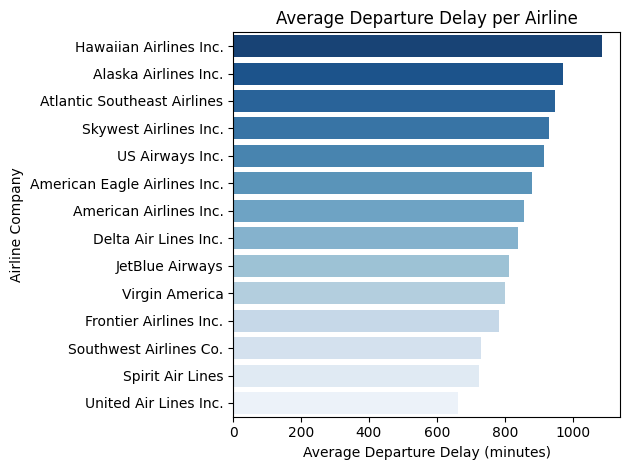

In [26]:
# Average Departure Delay per Airline

avg_dep_delay = flight_df.groupby('AIRLINE_COMPANY')['DEPARTURE_DELAY_MIN'].mean().sort_values(ascending=False)
sns.barplot(x=avg_dep_delay.values, y=avg_dep_delay.index, palette='Blues_r')
plt.title('Average Departure Delay per Airline')
plt.xlabel('Average Departure Delay')
plt.ylabel('Airline Company')
plt.tight_layout()
plt.show()


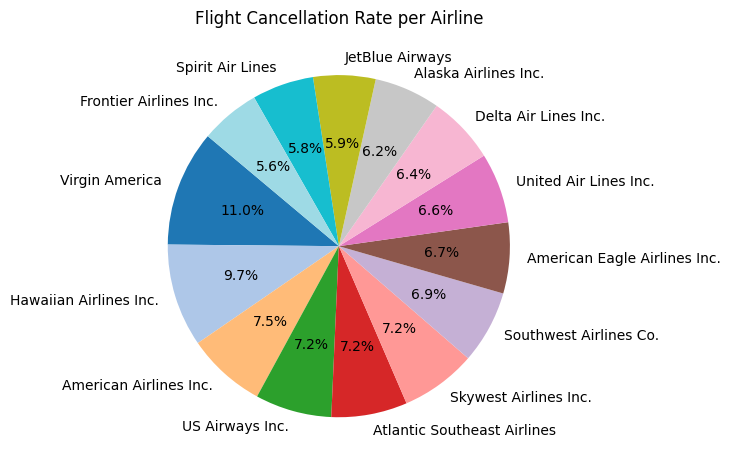

In [37]:
# Flight Cancellation Rate per Airline
cancel_rate = flight_df.groupby('AIRLINE_COMPANY')['CANCELLED'].mean().sort_values(ascending=False)
cancel_rate.plot(kind='pie', autopct='%1.1f%%', startangle=140, colormap='tab20')
plt.title('Flight Cancellation Rate per Airline')
plt.ylabel('')
plt.tight_layout()
plt.show()


<ipython-input-28-4e72613a1c90>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = top_airports.values, y = top_airports.index,palette='viridis')


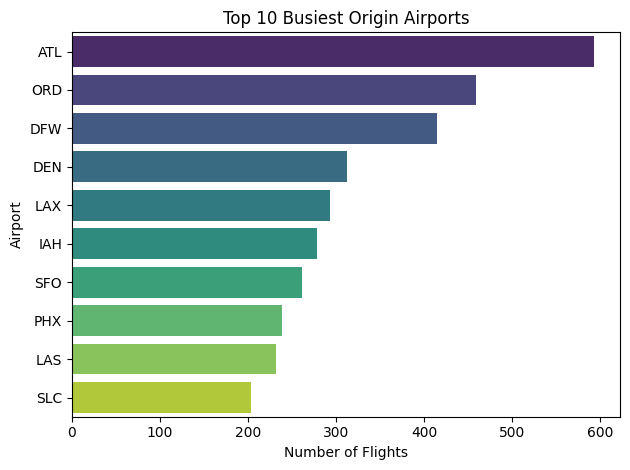

In [28]:
# Top 10 Busiest Origin Airports
top_airports = flight_df['ORIGIN_AIRPORT'].value_counts().head(10)
sns.barplot(x = top_airports.values, y = top_airports.index,palette='viridis')
plt.title('Top 10 Busiest Origin Airports')
plt.xlabel('Number of Flights')
plt.ylabel('Airport')
plt.tight_layout()
plt.show()

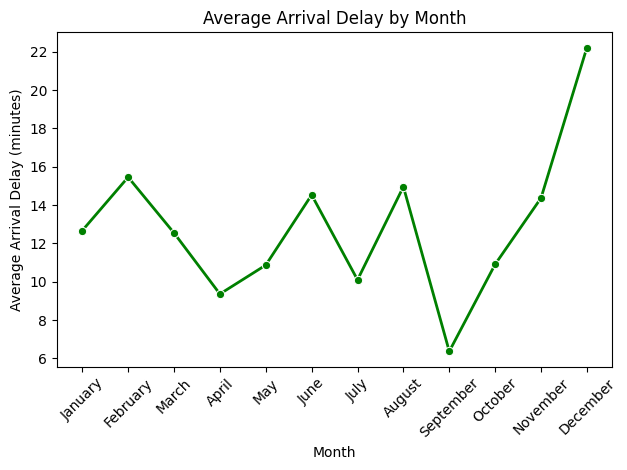

In [29]:
# Average Arrival Delay by Month

flight_df['ARRIVAL_DELAY'] = flight_df['ARRIVAL_DELAY'].apply(lambda x: 0 if x < 0 else x)
avg_arr_delay = flight_df.groupby('MONTHNAME')['ARRIVAL_DELAY'].mean().reindex([
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
])
sns.lineplot(x=avg_arr_delay.index, y=avg_arr_delay.values, marker='o', linewidth=2, color='green')
plt.title('Average Arrival Delay by Month')
plt.xlabel('Month')
plt.ylabel('Average Arrival Delay (minutes)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


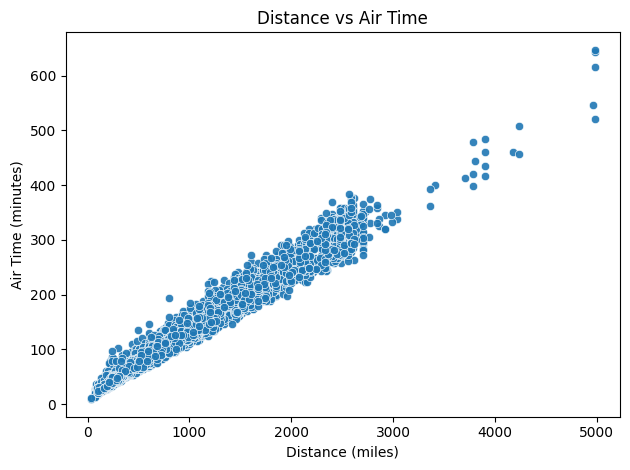

In [32]:
# 5. Distance vs Air Time

sns.scatterplot(x=flight_df['DISTANCE'], y=flight_df['AIR_TIME_MIN'], alpha=0.9)
plt.title('Distance vs Air Time')
plt.xlabel('Distance (miles)')
plt.ylabel('Air Time (minutes)')
plt.tight_layout()
plt.show()

<ipython-input-33-a3ab57b21a39>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_longest['DISTANCE'], y=top_longest['AIRLINE_COMPANY'], palette='coolwarm')


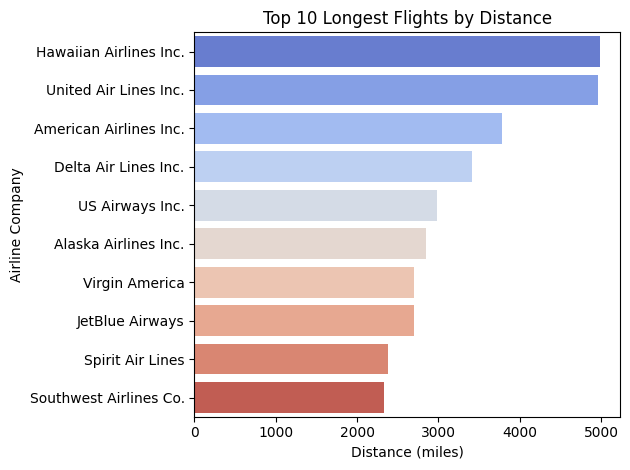

In [33]:
# Top 10 Longest Flights (by Distance)
top_longest_unique = flight_df.loc[flight_df.groupby('AIRLINE_COMPANY')['DISTANCE'].idxmax()]
top_longest = top_longest_unique.sort_values('DISTANCE', ascending=False).head(10)
sns.barplot(x=top_longest['DISTANCE'], y=top_longest['AIRLINE_COMPANY'], palette='coolwarm')
plt.title('Top 10 Longest Flights by Distance')
plt.xlabel('Distance (miles)')
plt.ylabel('Airline Company')

plt.tight_layout()
plt.show()

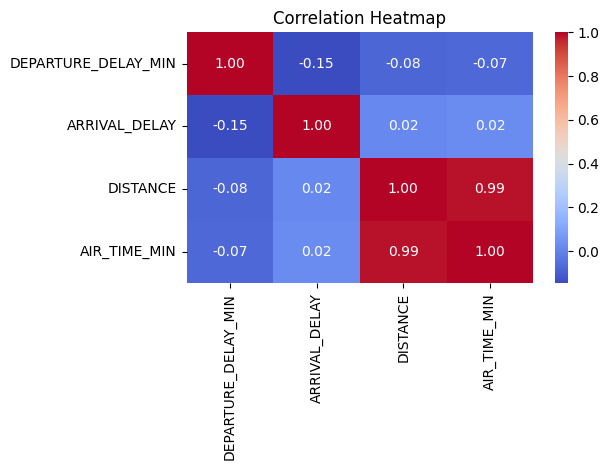

In [34]:
df_corr = flight_df[['DEPARTURE_DELAY_MIN', 'ARRIVAL_DELAY', 'DISTANCE', 'AIR_TIME_MIN']]
sns.heatmap(df_corr.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

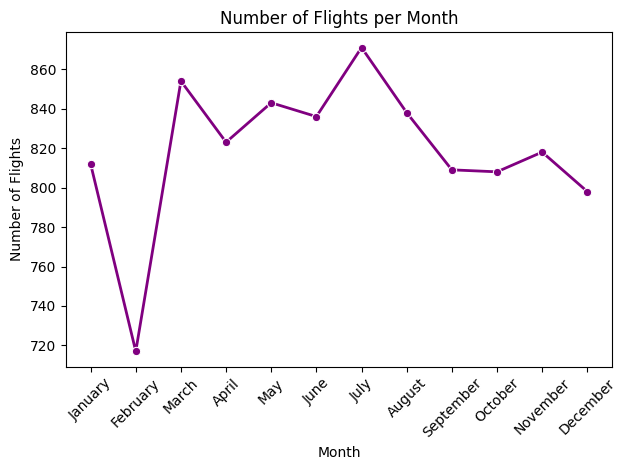

In [35]:
# Number of Flights per Month

flights_per_month = flight_df['MONTHNAME'].value_counts().reindex([
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
])
sns.lineplot(x=flights_per_month.index, y=flights_per_month.values, marker='o', linewidth=2, color='purple')
plt.title('Number of Flights per Month')
plt.xlabel('Month')
plt.ylabel('Number of Flights')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

<ipython-input-36-5360f3d7347a>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10_air_time['AIR_TIME_MIN'], y=top_10_air_time['FLIGHT_NUMBER'], palette='YlGnBu')


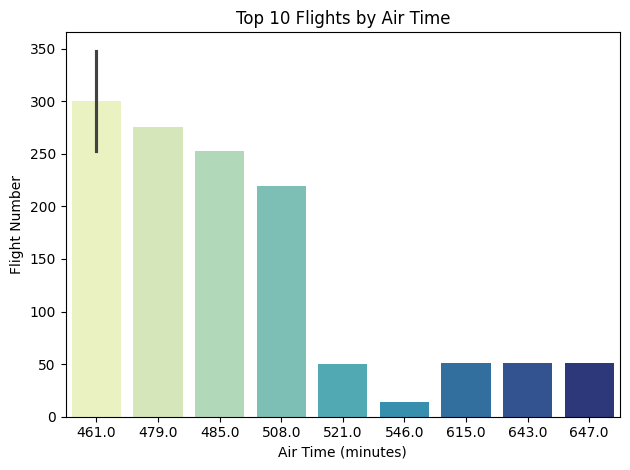

In [36]:
top_10_air_time = flight_df.sort_values('AIR_TIME_MIN', ascending=False).head(10)
sns.barplot(x=top_10_air_time['AIR_TIME_MIN'], y=top_10_air_time['FLIGHT_NUMBER'], palette='YlGnBu')
plt.title('Top 10 Flights by Air Time')
plt.xlabel('Air Time (minutes)')
plt.ylabel('Flight Number')
plt.tight_layout()
plt.show()

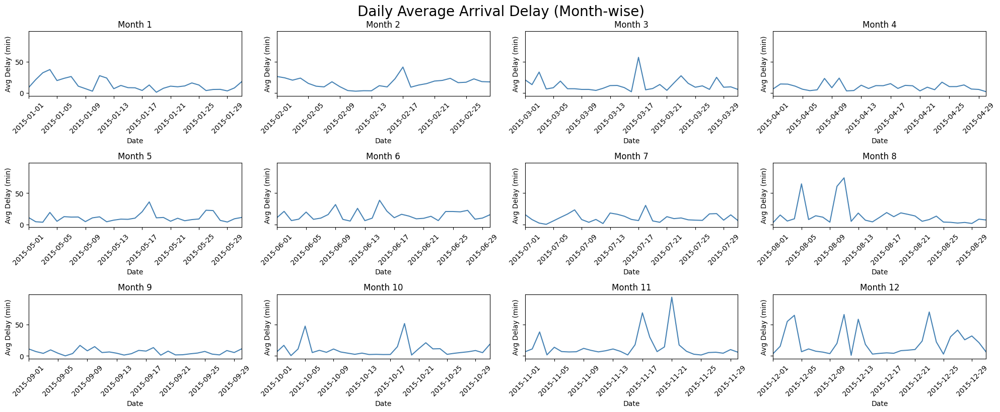

In [31]:
flight_df['DATE'] = pd.to_datetime(flight_df['DATE'])
flight_df['Month'] = flight_df['DATE'].dt.month
daily_delay = flight_df.groupby('DATE')['ARRIVAL_DELAY'].mean()
daily_delay = daily_delay.reset_index()
daily_delay['Month'] = daily_delay['DATE'].dt.month
fig, axes = plt.subplots(3, 4, figsize=(20, 8), sharey=True)
axes = axes.flatten()
for month in range(1, 13):
    ax = axes[month - 1]
    monthly_data = daily_delay[daily_delay['Month'] == month]
    ax.plot(monthly_data['DATE'], monthly_data['ARRIVAL_DELAY'], color='steelblue')
    ax.set_title(f'Month {month}')
    ax.set_xlabel('Date')
    ax.set_ylabel('Avg Delay (min)')
    ax.tick_params(axis='x', rotation=45)
    if not monthly_data.empty:
        ax.set_xlim(monthly_data['DATE'].min(), monthly_data['DATE'].max())
for i in range(12, len(axes)):
    fig.delaxes(axes[i])
plt.tight_layout()
plt.suptitle('Daily Average Arrival Delay (Month-wise)', fontsize=20, y=1.02)
plt.show()



In [56]:
import plotly.graph_objects as go


airport_info = flight_df[['ORIGIN_AIRPORT', 'CITY', 'LATITUDE', 'LONGITUDE']].drop_duplicates()
airport_info.columns = ['AIRPORT', 'CITY_NAME', 'LAT', 'LON']

flight_df = flight_df.merge(airport_info, left_on='ORIGIN_AIRPORT', right_on='AIRPORT', how='left')
flight_df.rename(columns={'CITY_NAME': 'ORIGIN_CITY_NAME', 'LAT': 'ORIGIN_LAT', 'LON': 'ORIGIN_LON'}, inplace=True)
flight_df.drop(columns='AIRPORT', inplace=True)

flight_df = flight_df.merge(airport_info, left_on='DESTINATION_AIRPORT', right_on='AIRPORT', how='left')
flight_df.rename(columns={'CITY_NAME': 'DEST_CITY_NAME', 'LAT': 'DEST_LAT', 'LON': 'DEST_LON'}, inplace=True)
flight_df.drop(columns='AIRPORT', inplace=True)

sample_df = flight_df[['ORIGIN_CITY_NAME', 'DEST_CITY_NAME', 'ORIGIN_LAT', 'ORIGIN_LON', 'DEST_LAT', 'DEST_LON']].dropna().head(500)

fig = go.Figure()

for _, row in sample_df.iterrows():
    fig.add_trace(go.Scattergeo(
        locationmode='USA-states',
        lon=[row['ORIGIN_LON'], row['DEST_LON']],
        lat=[row['ORIGIN_LAT'], row['DEST_LAT']],
        mode='lines',
        line=dict(width=1.2, color='blue', dash='dot'),
        opacity=0.5,
        hovertemplate=f"<b>{row['ORIGIN_CITY_NAME']}</b> → <b>{row['DEST_CITY_NAME']}</b><extra></extra>"
    ))

fig.update_layout(
    title_text='Flight Paths from City to City',
    showlegend=False,
    geo=dict(
        scope='usa',
        projection_type='albers usa',
        showland=True,
        landcolor='rgb(243, 243, 243)',
        subunitwidth=1,
        countrywidth=1,
        subunitcolor='rgb(217, 217, 217)',
        countrycolor='rgb(217, 217, 217)'
    )
)

fig.show()

In [57]:
sample_df = flight_df.groupby(['ORIGIN_AIRPORT', 'DESTINATION_AIRPORT']).size().reset_index(name='counts').sort_values('counts', ascending=False).head(20)
origins = list(sample_df['ORIGIN_AIRPORT'].unique())
destinations = list(sample_df['DESTINATION_AIRPORT'].unique())
labels = origins + destinations
label_map = {label: idx for idx, label in enumerate(labels)}
sample_df['source'] = sample_df['ORIGIN_AIRPORT'].map(label_map)
sample_df['target'] = sample_df['DESTINATION_AIRPORT'].map(label_map)
fig = go.Figure(data=[go.Sankey(
    node=dict(
      pad=15,
      thickness=20,
      line=dict(color="black", width=0.5),
      label=labels
    ),
    link=dict(
      source=sample_df['source'],
      target=sample_df['target'],
      value=sample_df['counts']
  ))])
fig.update_layout(title_text="Flight Flow from Origin to Destination", font_size=10)
fig.show()